# IVUS Challenge

In [1]:
from scipy import interpolate
import matplotlib.pyplot as plt
from matplotlib.path import Path
import numpy as np
import cv2
import random
import os
import keras
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import backend as K

from sklearn.model_selection import train_test_split

from keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import jaccard_score, classification_report, confusion_matrix
from skimage.metrics import hausdorff_distance
from skimage.measure import block_reduce


version = 2
seed = 123

2022-01-20 16:08:12.373000: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 14281683809298355998
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4997382144
locality {
  bus_id: 1
  links {
  }
}
incarnation: 13847620915135043118
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1060 with Max-Q Design, pci bus id: 0000:01:00.0, compute capability: 6.1"
]


2022-01-20 16:08:13.497877: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-01-20 16:08:13.498992: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-01-20 16:08:13.561276: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-20 16:08:13.561660: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1060 with Max-Q Design computeCapability: 6.1
coreClock: 1.48GHz coreCount: 10 deviceMemorySize: 5.94GiB deviceMemoryBandwidth: 178

## Prepare the data

### Read the images
The images are stored in the <i>Training_Set</i> folder. We will load the images from <i>Data_set_A</i>:

An empirical number of five temporally adjacent frames around the frame $F$ (two before and two after) have been included. It has been considered when more than two frames forward (and backward) in time are considered, consecutive IVUS frames might not be aligned. 

-  A training set: A subset (one fourth) of images from each dataset containing both images and manual annotations. The training set is meant for training and tuning of the algorithms prior to the evaluation. This dataset is distributed upon request for algorithm evaluation.
- A test set: The remaining frames compose the set of images that are used for performance evaluation. The annotations are not available before the algorithm evaluation in order to assure the complete blindness and equity of the algorithm assessment.

Annotations on the image datasets have been provided by four clinical experts, daily working with the specific IVUS echograph brand, and belonging to distinct medical centers. The annotation consists in the delineation of both inner wall (lumen contours) and outer wall (media/adventitia contours) on the IVUS images in the short-axis view. In all the cases, the experts were blinded to the other physicians’ annotations, and two of them repeated the manual annotations after about one week from the first labeling.


In [3]:
# Helper functions
def read_labels(directory, verbose=1):
    """
    Reads the labels from a given directory
    
    returns:
        A dictionary containing:
            'lum': array of labels of 2D coordinates
            'med': array of labels of 2D coordinates
    """
    labels_lum = []
    labels_med = []

    for file_name in sorted(os.listdir(directory)):
        points = []
        with open(os.path.join(directory, file_name)) as f:
            for line in f:
                c0, c1 = line.split(',')
                points.append((float(c0), float(c1)))

        if file_name.startswith("lum"):
            labels_lum.append(points)
        elif file_name.startswith("med"):
            labels_med.append(points)
    
    # We will have imbalances since the number of coordinates is not fixed
    # To use numpy array, we will extend every list of labels repeating the last element
    labels_lum = np.array(labels_lum, dtype=object)
    if type(labels_lum[0]) == list: # The dataset has no fixed number of rows or cols
        m = max([len(labels_lum[i]) for i in range(len(labels_lum))])
        for i in range(len(labels_lum)):
            labels_lum[i] = np.concatenate(
                (labels_lum[i], np.repeat([labels_lum[i][-1]],m-len(labels_lum[i]), axis=0))
            )
    
    labels_med = np.array(labels_med, dtype=object)
    if type(labels_med[0]) == list: # The dataset has no fixed number of rows or cols
        m = max([len(labels_med[i]) for i in range(len(labels_med))])
        for i in range(len(labels_med)):
            labels_med[i] = np.concatenate(
                (labels_med[i], np.repeat([labels_med[i][-1]],m-len(labels_med[i]), axis=0))
            )

    # We have np.arrays inside np.arrays, we have to undo this
    labels = {
        'lum': np.array([l.tolist() for l in labels_lum]),
        'med': np.array([l.tolist() for l in labels_med])
    }

    if verbose:
        print(f"Annotation for the inner wall (lumen contours): {labels['lum'].shape}")
        print(f"Annotation for the outer wall (media/adventitia contours): {labels['med'].shape}")
        
    return labels

def read_training_dataset(letter="A", verbose=1):
    """
    Reads the training dataset A or B
    
    returns:
        Two tuples (x_train, y_train_label), (x_test, y_test_label):
            x_train: dataset of images for training
            y_train_label: a dictionary containing:
                'lum': array of labels of 2D coordinates
                'med': array of labels of 2D coordinates
            x_test: dataset of images for testing
            y_test_label: a list of 3 dictionaries containing:
                'lum': array of labels of 2D coordinates
                'med': array of labels of 2D coordinates
    """
    path = os.path.join(os.getcwd(), "Training_Set", "Data_set_"+letter, "DCM")

    dataset = []
    subset = []

    count = 0
    for file_name in sorted(os.listdir(path)):
        count += 1
        subset.append(cv2.imread(os.path.join(path, file_name), cv2.IMREAD_GRAYSCALE))

        if count >= 5:
            dataset.append(subset)
            subset = []
            count = 0

    dataset = np.array(dataset)
    
    if verbose:
        print(f"Dataset {letter} has shape: {dataset.shape}")
    
    # Read the labels
    y_train_labels = []
    y_train_directory = os.path.join(os.getcwd(), "Training_Set", "Data_set_"+letter, "LABELS")
    for dir_name in ['LABELS_obs1']:
        directory = os.path.join(y_train_directory, dir_name)
        y_train_labels.append(read_labels(directory, verbose))
    
    num_training_labels = y_train_labels[0]['lum'].shape[0]
    x_train = dataset[:num_training_labels, :, :, :]
    
    x_test = dataset[num_training_labels:, :, :, :]
    
    # Read test labels
    y_test_labels = []
    y_test_directory = os.path.join(os.getcwd(), "Test_Set", "Data_set_"+letter)
    for dir_name in ['LABELS_obs1', 'LABELS_obs2_v1', 'LABELS_obs2_v2']:
        directory = os.path.join(y_test_directory, dir_name)
        y_test_labels.append(read_labels(directory, verbose))
    
    return (x_train, y_train_labels), (x_test, y_test_labels)

In [4]:
(x_train, y_train_labels), (x_test, y_test_labels) = read_training_dataset("B")

Dataset B has shape: (435, 5, 384, 384)
Annotation for the inner wall (lumen contours): (109, 360, 2)
Annotation for the outer wall (media/adventitia contours): (109, 360, 2)
Annotation for the inner wall (lumen contours): (326, 360, 2)
Annotation for the outer wall (media/adventitia contours): (326, 360, 2)
Annotation for the inner wall (lumen contours): (326, 581, 2)
Annotation for the outer wall (media/adventitia contours): (326, 719, 2)
Annotation for the inner wall (lumen contours): (326, 583, 2)
Annotation for the outer wall (media/adventitia contours): (326, 720, 2)


#### Downsample images for better training
Now we will downsample our training and test dataset in order to be more memory-efficient when training. We must note that when we downsample by a half our images (from 384x384 to 192x192 in dataset B), then we need to divide by 2 our contour coordinates as well.

In [5]:
from skimage.measure import block_reduce
def downsample_image(image):
    """Downsample image by half by applying mean pooling"""
    return block_reduce(image, block_size=(2,2), func=np.mean)

In [6]:
x_train_ds = []
for batch in x_train:
    x_train_ds.append([downsample_image(image) for image in batch])

x_train_ds = np.array(x_train_ds)
y_train_label_ds = []
for label in y_train_labels:
    y_train_label_ds.append({
        'lum': label['lum']/2.,
        'med': label['med']/2.
    })

x_test_ds = []
for batch in x_test:
    x_test_ds.append([downsample_image(image) for image in batch])

x_test_ds = np.array(x_test_ds)
y_test_label_ds = []
for label in y_test_labels:
    y_test_label_ds.append({
        'lum': label['lum']/2.,
        'med': label['med']/2.
    })

print(f"Training set now has shape {x_train_ds.shape}")
print(f"Test set now has shape {x_test_ds.shape}")

Training set now has shape (109, 5, 192, 192)
Test set now has shape (326, 5, 192, 192)


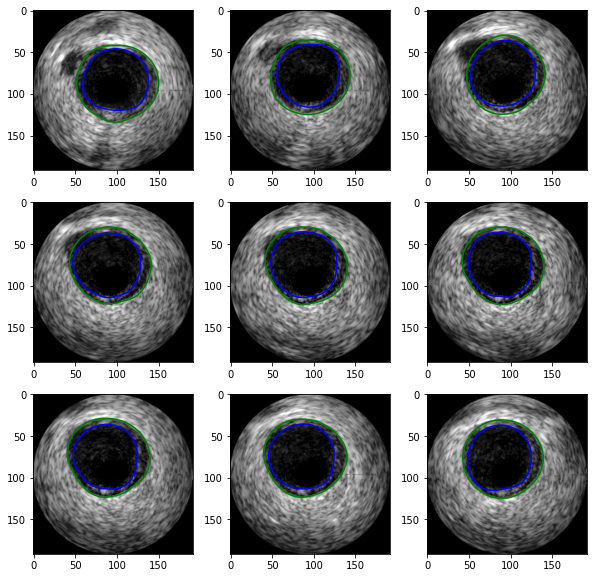

In [7]:
# Display some images
plt.figure(figsize=(10, 10))

for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.plot(y_train_label_ds[0]['lum'][i][:, 0], y_train_label_ds[0]['lum'][i][:, 1], 'b-')
    plt.plot(y_train_label_ds[0]['med'][i][:, 0], y_train_label_ds[0]['med'][i][:, 1], 'g-')
    plt.imshow(x_train_ds[i][2], cmap='gray')

### Create a set of mask images
We will use the labels we have to mask the interior of the paths they draw. Since we have three different classes: background, media and lumen; we will create a multiclass segmentation.

In [8]:
num_classes = 3
CLASSES = ['background', 'media', 'lumen']

In [9]:
def create_masks(x, y):
    """
    Create masks from a dataset and its labels
    
    parameters:
        x: dataset of images
        y: array of labels of 2D coordinates
    returns:
        An array containing multiclass images segmented as follows:
            - Value 0 represents background
            - Value 1 represents the media
            - Value 2 represents the lumen
    """
    
    masks = []

    for i in range(y['lum'].shape[0]):
        # Retrieve path from the label
        path_lum = Path(y['lum'][i])
        path_med = Path(y['med'][i])
        img = x[i][2]

        # Create a matrix of coordinates to check which points are inside the closed path
        img_meshgrid = np.array(np.meshgrid(*(np.arange(s) for s in img.shape[:2]), indexing='xy'))
        img_coordinates = img_meshgrid.transpose([1,2,0]).reshape(img.shape[0]*img.shape[1],2)
        mask_lum = path_lum.contains_points(img_coordinates).reshape(img.shape[0],img.shape[1])
        mask_med = path_med.contains_points(img_coordinates).reshape(img.shape[0],img.shape[1])

        final_mask = mask_lum.astype(int) + mask_med.astype(int)
        
        masks.append(final_mask)
        
    return np.array(masks)

def get_one_hot(targets, nb_classes):
    """Returns the targets as one-hot encoded"""
    res = np.eye(nb_classes)[np.array(targets).reshape(-1)]
    return res.reshape(list(targets.shape)+[nb_classes])

### One-hot encoding
We one-hot encode our labels in the following way:
- Background pixels: [1, 0, 0]
- Media pixels: [0, 1, 0]
- Lumen pixels: [0, 0, 1]

This encoding will help optimize our model because we plan to output the probability of each pixel belonging to a certain class.

In [10]:
masks = np.concatenate(
    [create_masks(x_train_ds, observer_labels) for observer_labels in y_train_label_ds]
)
    
y_train_ds = get_one_hot(masks, num_classes)
x_train_ds = np.concatenate([x_train_ds for _ in range(len(y_train_label_ds))])

In [11]:
# GET TEST IMAGES
masks = np.concatenate(
    [create_masks(x_test_ds, observer_labels) for observer_labels in y_test_label_ds]
)
    
y_test_ds = get_one_hot(masks, num_classes)
x_test_ds = np.concatenate([x_test_ds for _ in range(len(y_test_label_ds))])

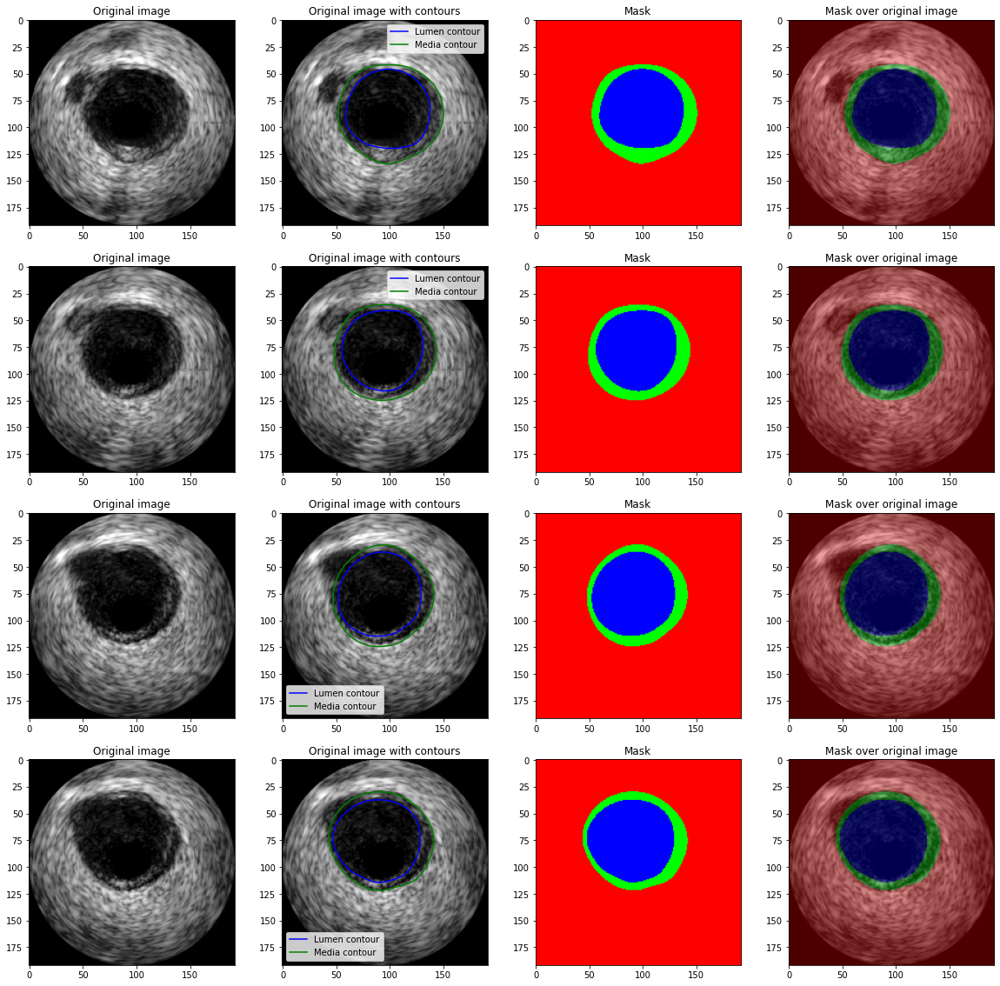

In [12]:
# Let's show some examples
plt.figure(figsize=(20, 20))

samples = 4

for i in range(samples):
    
    
    ax = plt.subplot(samples, 4, 4*i + 1)
    plt.imshow(x_train_ds[i][2], cmap='gray')
    plt.title('Original image')
    
    ax = plt.subplot(samples, 4, 4*i + 2)
    plt.plot(y_train_label_ds[0]['lum'][i][:, 0], y_train_label_ds[0]['lum'][i][:, 1], 'b-', label='Lumen contour')
    plt.plot(y_train_label_ds[0]['med'][i][:, 0], y_train_label_ds[0]['med'][i][:, 1], 'g-', label='Media contour')
    plt.imshow(x_train_ds[i][2], cmap='gray')
    plt.title('Original image with contours')
    plt.legend()
    
    
    mask = y_train_ds[i]/y_train_ds.max()
    ax = plt.subplot(samples, 4, 4*i + 3)
    plt.imshow(mask)
    plt.title('Mask')
    
    
    image = np.repeat(x_train_ds[i][2][..., np.newaxis], 3, axis=2)
    alpha = 0.7
    ax = plt.subplot(samples, 4, 4*i + 4)
    plt.imshow(np.uint8(image*alpha + mask*255*(1-alpha)))
    plt.title('Mask over original image')

### Data augmentation
We have 19 images to train using dataset A and 109 images in dataset B. Therefore we should apply Data Augmentation in order to get more training examples to feed into our model.

In this test we will only use the images adjacent to the middle image and we will pass these 3 images as 3 channels RGB to the data generator.

In [13]:
images = x_train_ds[:, 2:5, :, :].transpose([0, 2, 3, 1])/255 # Now the shape is (109, 192, 192, 3) (for dataset B)
masks = np.copy(y_train_ds) # Now the shape is (109, 384, 384, channels) (for dataset B)
num_classes = 3

print(f"Shape of set images: {images.shape}")
print(f"Shape of set masks: {masks.shape}")


batch_size = 8
input_shape = images.shape[1:] # (384, 384, 3)

images_test = x_test_ds[:, 2:5, :, :].transpose([0, 2, 3, 1])/255 # Now the shape is (num_images, 192, 192, 3) (for dataset B)
masks_test = np.copy(y_test_ds) # Now the shape is (num_images, 192, 192, channels) (for dataset B)

    
print(f"Shape of set images_test: {images_test.shape}")
print(f"Shape of set masks_test: {masks_test.shape}")

Shape of set images: (109, 192, 192, 3)
Shape of set masks: (109, 192, 192, 3)
Shape of set images_test: (978, 192, 192, 3)
Shape of set masks_test: (978, 192, 192, 3)


In [14]:
from keras.preprocessing.image import ImageDataGenerator

batch_size = 20

def get_image_generator(data_gen_args=dict(data_format="channels_last", validation_split=0.15),
                        images=images,
                        masks=masks,
                        batch_size=batch_size):
    # we create two instances with the same arguments
    val_data_gen_args = dict(
        data_format=data_gen_args['data_format'],
        validation_split=data_gen_args['validation_split']
    )

    image_datagen = ImageDataGenerator(**data_gen_args)
    mask_datagen = ImageDataGenerator(**data_gen_args)

    val_datagen = ImageDataGenerator(**val_data_gen_args)

    image_datagen.fit(images, augment=True, seed=seed)
    mask_datagen.fit(masks, augment=True, seed=seed)

    # Provide the same seed and keyword arguments to the fit and flow methods
    image_generator = image_datagen.flow(images, seed=seed, batch_size=batch_size, subset='training')
    mask_generator = mask_datagen.flow(masks, seed=seed, batch_size=batch_size, subset='training')

    image_val_generator = val_datagen.flow(images, seed=seed, batch_size=batch_size, subset='validation')
    mask_val_generator = val_datagen.flow(masks, seed=seed, batch_size=batch_size, subset='validation')

    # combine generators into one which yields image and masks
    train_generator = zip(image_generator, mask_generator)
    val_generator = zip(image_val_generator, mask_val_generator)
    
    return train_generator, val_generator

def gen_dtype(gen):
    while True:
        for i,j in gen:
            yield (i.astype('float32'), j.astype('float32'))

#def gen_dtype_test(gen):
#    for i,j in gen:
#        yield (i.astype('float32'), to_categorical(j.astype('int'), num_classes=num_classes))

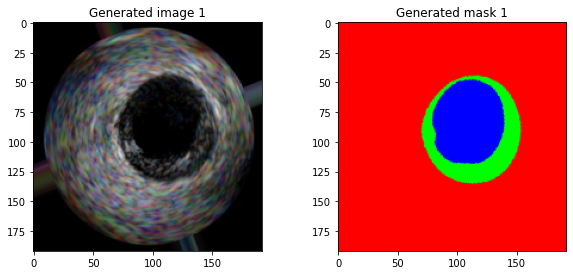

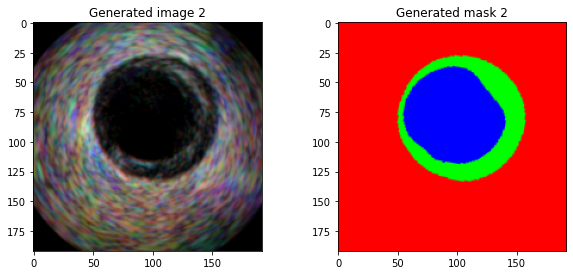

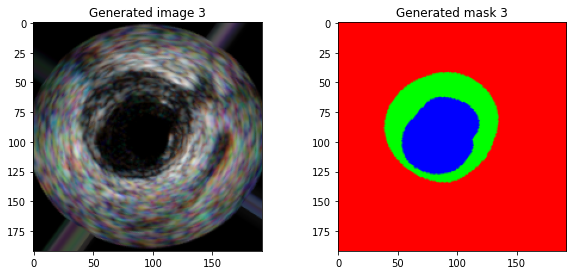

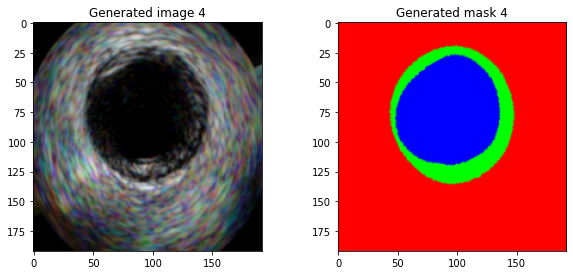

In [15]:
# Let's show some example
data_gen_args = dict(
    rotation_range=90,
    zoom_range=0.2,
    data_format="channels_last",
    validation_split=0.15
)
train_generator, val_generator = get_image_generator(data_gen_args)
images_gen, masks_gen = next(gen_dtype(train_generator))
samples = len(images_gen)

for i in range(4):
    plt.figure(figsize=(10,100))
    plt.subplot(samples, 2, 2*i+1)
    plt.imshow(images_gen[i], cmap='gray')
    plt.title(f"Generated image {i+1}")
    
    plt.subplot(samples, 2, 2*i+2)
    plt.imshow(masks_gen[i])
    plt.title(f"Generated mask {i+1}")

## Transfer Learning with U-Net

### Transfer learning
We will leverage the knowledge in a model that's already good at segmentation. This deep learning technique enables developers to harness a neural network used for one task and apply it to another domain. Transfer Learning differs from traditional Machine Learning or Deep Learning in that it is the use of pre-trained models that have been used for another task to jump start the development process on a new task or problem.

### What is a pre-trained model?
A pre-trained model is a model that was trained on a large benchmark dataset to solve a problem similar to the one that we want to solve. Accordingly, due to the computational cost of training such models, it is common practice to import and use models from published literature (e.g. VGG, Inception, MobileNet).
By using pre-trained models which have been previously trained on large datasets, we can directly use the weights and architecture obtained and apply the learning on our problem statement. This is known as transfer learning. We **transfer the learning** of the pre-trained model to our specific problem statement.

### The typical transfer-learning workflow

1. Instantiate a base model and load pre-trained weights into it.
2. Freeze all layers in the base model by setting trainable = False.
3. Create a new model on top of the output of one (or several) layers from the base model.
4. Train your new model on your new dataset.

Note that an alternative, more lightweight workflow could also be:

1. Instantiate a base model and load pre-trained weights into it.
2. Run your new dataset through it and record the output of one (or several) layers from the base model. This is called **feature extraction**.
3. Use that output as input data for a new, smaller model.

A key advantage of that second workflow is that you only run the base model once on your data, rather than once per epoch of training. So it's a lot faster & cheaper.

An issue with that second workflow, though, is that it doesn't allow you to dynamically modify the input data of your new model during training, which is required when doing data augmentation, for instance. Transfer learning is typically used for tasks when your new dataset has too little data to train a full-scale model from scratch, and in such scenarios data augmentation is very important. So in what follows, we will focus on the first workflow.

### InceptionResNetV2

In [16]:
from Semantic_Segmentation_Architecture.TensorFlow.inception_resnetv2_unet import build_inception_resnetv2_unet
tf.keras.backend.clear_session()
inception_model = build_inception_resnetv2_unet(input_shape)
inception_model.summary()

2022-01-20 16:09:54.034695: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-20 16:09:54.034835: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce GTX 1060 with Max-Q Design computeCapability: 6.1
coreClock: 1.48GHz coreCount: 10 deviceMemorySize: 5.94GiB deviceMemoryBandwidth: 178.99GiB/s
2022-01-20 16:09:54.034984: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-20 16:09:54.035188: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-20 16:09:54.035274: I tens

Model: "InceptionResNetV2_U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 192, 192, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 95, 95, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 95, 95, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 95, 95, 32)   0           batch_normalization[0][0]        
____________________________________________________________________________

In [17]:
from keras.utils.vis_utils import plot_model
plot_model(inception_model,to_file='inception_struct.png',show_shapes=True, show_layer_names=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.633118 to fit



In [17]:
inception_layers = [(layer, layer.name, layer.trainable) for layer in inception_model.layers]
inception_model_df = pd.DataFrame(inception_layers, columns=["Layer Type", "Layer Name", "Layer Trainable"])

display(inception_model_df)

,Layer Type,Layer Name,Layer Trainable
0,<tensorflow.python.keras.engine.input_layer.In...,input_1,False
1,<tensorflow.python.keras.layers.convolutional....,conv2d,False
2,<tensorflow.python.keras.layers.normalization_...,batch_normalization,False
3,<tensorflow.python.keras.layers.core.Activatio...,activation,False
4,<tensorflow.python.keras.layers.convolutional....,conv2d_1,False
...,...,...,...
633,<tensorflow.python.keras.layers.core.Activatio...,activation_209,True
634,<tensorflow.python.keras.layers.convolutional....,conv2d_210,True
635,<tensorflow.python.keras.layers.normalization_...,batch_normalization_210,True
636,<tensorflow.python.keras.layers.core.Activatio...,activation_210,True


## Training the transfer learning U-Net model

Define the loss and metrics functions

In [18]:
#calculates dice considering an input with a single class
def dice_single(true, pred, smooth=1.):
    true = K.batch_flatten(true)
    pred = K.batch_flatten(pred)
    pred = K.round(pred)

    intersection = K.sum(true * pred, axis=-1)
    true = K.sum(true, axis=-1)
    pred = K.sum(pred, axis=-1)

    return ((2*intersection) + smooth) / (true + pred + smooth)

def dice_for_class(index, smooth=1.):
    def dice_inner(true, pred):

        #get only the desired class
        true = true[:,:,:,index]
        pred = pred[:,:,:,index]

        #return dice per class
        return dice_single(true, pred, smooth)
    dice_inner.__name__ = f'dice_{CLASSES[index]}'
    return dice_inner

def dice_coef_loss(y_true, y_pred, smooth=1.):
    """
    Dice loss to minimize: 1 - Dice
    Dice = (2*|X & Y|)/ (|X| + |Y|)
         =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
    ref: https://arxiv.org/pdf/1606.04797v1.pdf
    """
    # Ignore label 0 which belongs to background
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred, axis=-1)
    denom = K.sum(y_true + y_pred, axis=-1)
    dice = K.mean(((2. * intersection + smooth) / (denom + smooth)))
    return 1 - dice

    
def jaccard_coef_loss(y_true, y_pred, smooth=1.):
    """Jaccard distance for semantic segmentation.
    Also known as the intersection-over-union loss.
    
    source code: 
    https://github.com/keras-team/keras-contrib/blob/master/keras_contrib/losses/jaccard.py
    
    Parameters
    -----------
    y_true : Tensor
        A distribution with shape: [batch_size, ....], (any dimensions).
    y_pred : Tensor
        The target distribution, format the same with `output`.
    smooth : float
        This small value will be added to the numerator and denominator.
            - If both output and target are empty, it makes sure dice is 1.
            - If either output or target are empty (all pixels are background),
            dice = ```smooth/(small_value + smooth)``,
            then if smooth is very small, dice close to 0 (even the image values lower than the threshold),
            so in this case, higher smooth can have a higher dice.
            
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=-1)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return (1 - jac) * smooth

In [19]:
# Classification metrics
def get_specificity(col, cm):
    """Return the specificity of a variable in a 3x3 confusion matrix"""
    col_bef = (col-1)%3
    col_aft = (col+1)%3
    
    tp = cm[col,col]
    tn = cm[col_bef,col_bef] + cm[col_aft,col_aft]
    fp = cm[col_bef,col] + cm[col_aft,col]
    fn = cm[col,col_bef] + cm[col,col_aft]
    
    return float(tn)/float(tn+fp)

def get_accuracy(col, cm):
    """Return the accuracy of a variable in a 3x3 confusion matrix"""
    col_bef = (col-1)%3
    col_aft = (col+1)%3
    
    tp = cm[col,col]
    tn = cm[col_bef,col_bef] + cm[col_aft,col_aft]
    fp = cm[col_bef,col] + cm[col_aft,col]
    fn = cm[col,col_bef] + cm[col,col_aft]
    
    return float(tp+tn)/float(tp+tn+fp+fn)

from sklearn.metrics import jaccard_score, classification_report, confusion_matrix
from skimage.metrics import hausdorff_distance
import pandas as pd

def custom_classification_report(y_true, y_pred, classes=['background', 'media', 'lumen']):
    
    # Obtain precision, recall, f1-score and support
    data = classification_report(
        y_true.flatten(),
        y_pred.flatten(),
        output_dict=True,
        target_names=classes
    )
    data.pop('macro avg')
    data.pop('weighted avg')
    data.pop('accuracy')
    
    # Get jaccard score
    jacc = jaccard_score(
        y_true.flatten(),
        y_pred.flatten(),
        average=None
    )
    
    # Compute hausdorff distance of every image
    hausdorff_dist_list = np.zeros((len(classes), len(y_true)))
    for i in range(len(y_true)):
        # Ground truth
        gt = y_true[i]
        # Predicted segmentation
        seg = y_pred[i]

        # Evaluate for each class
        for j in range(len(classes)):
            hausdorff_dist_list[j, i] = hausdorff_distance(gt==j, seg==j)
    hd = hausdorff_dist_list
    
    # Finally compute specificity
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten())
    for i in range(len(classes)):
        data[classes[i]]['specificity'] = get_specificity(i, cm)
        data[classes[i]]['accuracy'] = get_accuracy(i, cm)
        data[classes[i]]['jaccard_score'] = jacc[i]
        data[classes[i]]['hausdorff_dist'] = hd[i]
    
    return pd.DataFrame(data)

In [20]:
from sklearn.model_selection import KFold

def get_callbacks(name_weights, patience_lr):
    mcp_save = keras.callbacks.ModelCheckpoint(
        name_weights,
        save_weights_only=True,
        save_best_only=True,
        monitor='val_loss',
        mode='min'
    )
    reduce_lr_loss = keras.callbacks.ReduceLROnPlateau(
        monitor='loss',
        factor=0.1,
        patience=patience_lr,
        verbose=1,
        min_delta=1e-4,
        mode='min'
    )
    return [mcp_save, reduce_lr_loss]

loss = jaccard_coef_loss
optimizer = keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
metrics = [dice_for_class(i) for i in range(num_classes)]

data_gen_args = dict(
    rotation_range=90,
    zoom_range=0.2,
    data_format="channels_last",
    validation_split=0
)

In [21]:
foldsB = [(0,
  (np.array([  1,   2,   3,   6,   7,   9,  10,  11,  12,  14,  15,  16,  17,
           18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  29,  30,  32,
           34,  35,  36,  37,  39,  40,  43,  44,  45,  46,  47,  48,  49,
           50,  51,  52,  53,  54,  55,  57,  58,  59,  60,  61,  64,  66,
           67,  68,  69,  71,  72,  73,  75,  76,  77,  78,  79,  80,  82,
           83,  84,  86,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99,
          100, 101, 102, 103, 104, 105, 106, 107, 108]),
   np.array([ 0,  4,  5,  8, 13, 28, 31, 33, 38, 41, 42, 56, 62, 63, 65, 70, 74,
          81, 85, 87, 88, 89]))),
 (1,
  (np.array([  0,   1,   2,   3,   4,   5,   6,   7,   8,  10,  11,  13,  14,
           15,  16,  17,  18,  20,  22,  25,  26,  27,  28,  30,  31,  32,
           33,  34,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,
           47,  48,  49,  51,  52,  55,  56,  57,  58,  59,  60,  61,  62,
           63,  64,  65,  66,  67,  68,  69,  70,  73,  74,  75,  76,  77,
           78,  80,  81,  83,  84,  85,  86,  87,  88,  89,  90,  92,  93,
           94,  96,  97,  98, 102, 103, 106, 107, 108]),
   np.array([  9,  12,  19,  21,  23,  24,  29,  35,  50,  53,  54,  71,  72,
           79,  82,  91,  95,  99, 100, 101, 104, 105]))),
 (2,
  (np.array([  0,   2,   3,   4,   5,   7,   8,   9,  10,  12,  13,  17,  18,
           19,  21,  22,  23,  24,  25,  27,  28,  29,  31,  32,  33,  34,
           35,  36,  38,  39,  40,  41,  42,  46,  47,  48,  49,  50,  52,
           53,  54,  55,  56,  57,  58,  61,  62,  63,  64,  65,  66,  67,
           68,  69,  70,  71,  72,  73,  74,  75,  78,  79,  80,  81,  82,
           83,  84,  85,  86,  87,  88,  89,  91,  92,  95,  96,  97,  98,
           99, 100, 101, 102, 103, 104, 105, 106, 108]),
   np.array([  1,   6,  11,  14,  15,  16,  20,  26,  30,  37,  43,  44,  45,
           51,  59,  60,  76,  77,  90,  93,  94, 107]))),
 (3,
  (np.array([  0,   1,   4,   5,   6,   8,   9,  11,  12,  13,  14,  15,  16,
           17,  19,  20,  21,  23,  24,  25,  26,  28,  29,  30,  31,  32,
           33,  35,  36,  37,  38,  41,  42,  43,  44,  45,  46,  47,  49,
           50,  51,  53,  54,  56,  57,  59,  60,  62,  63,  65,  66,  68,
           70,  71,  72,  73,  74,  76,  77,  78,  79,  80,  81,  82,  83,
           85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
           98,  99, 100, 101, 102, 103, 104, 105, 107]),
   np.array([  2,   3,   7,  10,  18,  22,  27,  34,  39,  40,  48,  52,  55,
           58,  61,  64,  67,  69,  75,  84, 106, 108]))),
 (4,
  (np.array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
           13,  14,  15,  16,  18,  19,  20,  21,  22,  23,  24,  26,  27,
           28,  29,  30,  31,  33,  34,  35,  37,  38,  39,  40,  41,  42,
           43,  44,  45,  48,  50,  51,  52,  53,  54,  55,  56,  58,  59,
           60,  61,  62,  63,  64,  65,  67,  69,  70,  71,  72,  74,  75,
           76,  77,  79,  81,  82,  84,  85,  87,  88,  89,  90,  91,  93,
           94,  95,  99, 100, 101, 104, 105, 106, 107, 108]),
   np.array([ 17,  25,  32,  36,  46,  47,  49,  57,  66,  68,  73,  78,  80,
           83,  86,  92,  96,  97,  98, 102, 103])))]


Fold  0


2022-01-09 20:30:45.637446: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-01-09 20:30:45.655774: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2299965000 Hz
2022-01-09 20:30:51.684217: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2022-01-09 20:30:52.269589: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8202
2022-01-09 20:30:52.895748: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-01-09 20:30:52.895771: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2022-01-09 20:30:52.896165: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-01-09 20:30:52.896211: W tensorflow/stream_executor/gpu/redzone_allocator.cc:31

31/31 [==============================] - 23s 599ms/step - loss: 0.0211 - dice_background: 0.9885 - dice_media: 0.7649 - dice_lumen: 0.9209


2022-01-09 20:38:00.833421: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 432635904 exceeds 10% of free system memory.
2022-01-09 20:38:23.200431: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 432635904 exceeds 10% of free system memory.


,background,media,lumen
precision,0.986119,0.801097,0.922288
recall,0.991257,0.738373,0.929859
f1-score,0.988682,0.768457,0.926058
support,30795773,2353746,2903473
specificity,0.91172,0.987179,0.992999
accuracy,0.980402,0.970917,0.987819
jaccard_score,0.977617,0.623979,0.862298
hausdorff_dist,"[2.8284271247461903, 2.8284271247461903, 4.123...","[2.8284271247461903, 2.8284271247461903, 4.242...","[2.8284271247461903, 2.23606797749979, 2.23606..."



Fold  1


/tmp/ipykernel_58844/2708573062.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f1.show()
/tmp/ipykernel_58844/2708573062.py:60: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f2.show()
/tmp/ipykernel_58844/2708573062.py:70: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f3.show()
/tmp/ipykernel_58844/2708573062.py:80: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f4.show()
2022-01-09 20:47:44.111274: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 432635904 exceeds 10% of free system memory.


31/31 [==============================] - 13s 431ms/step - loss: 0.0221 - dice_background: 0.9877 - dice_media: 0.7340 - dice_lumen: 0.9191


,background,media,lumen
precision,0.982402,0.831487,0.908663
recall,0.993291,0.674037,0.941328
f1-score,0.987816,0.744529,0.924707
support,30795773,2353746,2903473
specificity,0.887429,0.990443,0.991534
accuracy,0.978842,0.969754,0.987411
jaccard_score,0.975926,0.593027,0.859958
hausdorff_dist,"[5.830951894845301, 5.385164807134504, 8.06225...","[5.830951894845301, 5.385164807134504, 10.7703...","[3.1622776601683795, 2.23606797749979, 2.23606..."



Fold  2


/tmp/ipykernel_58844/2708573062.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f1.show()
/tmp/ipykernel_58844/2708573062.py:60: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f2.show()
/tmp/ipykernel_58844/2708573062.py:70: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f3.show()
/tmp/ipykernel_58844/2708573062.py:80: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f4.show()


31/31 [==============================] - 13s 422ms/step - loss: 0.0232 - dice_background: 0.9869 - dice_media: 0.7399 - dice_lumen: 0.9095


,background,media,lumen
precision,0.982211,0.795278,0.921888
recall,0.992201,0.698286,0.913578
f1-score,0.987181,0.743633,0.917714
support,30795773,2353746,2903473
specificity,0.885887,0.98742,0.993068
accuracy,0.977737,0.968508,0.986535
jaccard_score,0.974686,0.591891,0.847941
hausdorff_dist,"[4.47213595499958, 4.242640687119285, 5.0, 8.6...","[5.0, 4.123105625617661, 8.54400374531753, 14....","[2.8284271247461903, 2.23606797749979, 2.82842..."



Fold  3


/tmp/ipykernel_58844/2708573062.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f1.show()
/tmp/ipykernel_58844/2708573062.py:60: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f2.show()
/tmp/ipykernel_58844/2708573062.py:70: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f3.show()
/tmp/ipykernel_58844/2708573062.py:80: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f4.show()


31/31 [==============================] - 14s 437ms/step - loss: 0.0222 - dice_background: 0.9876 - dice_media: 0.7534 - dice_lumen: 0.9186


,background,media,lumen
precision,0.982819,0.78555,0.949028
recall,0.992936,0.73235,0.89751
f1-score,0.987851,0.758018,0.92255
support,30795773,2353746,2903473
specificity,0.890104,0.986017,0.995686
accuracy,0.978909,0.969436,0.987621
jaccard_score,0.975994,0.610329,0.856235
hausdorff_dist,"[6.4031242374328485, 5.656854249492381, 6.3245...","[6.708203932499369, 5.656854249492381, 6.32455...","[2.8284271247461903, 2.23606797749979, 2.82842..."



Fold  4

Epoch 00089: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


/tmp/ipykernel_58844/2708573062.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f1.show()
/tmp/ipykernel_58844/2708573062.py:60: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f2.show()
/tmp/ipykernel_58844/2708573062.py:70: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f3.show()
/tmp/ipykernel_58844/2708573062.py:80: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f4.show()


31/31 [==============================] - 17s 550ms/step - loss: 0.0232 - dice_background: 0.9876 - dice_media: 0.7426 - dice_lumen: 0.9102


,background,media,lumen
precision,0.984539,0.752398,0.949208
recall,0.990896,0.753692,0.882878
f1-score,0.987708,0.753044,0.914842
support,30795773,2353746,2903473
specificity,0.900512,0.982657,0.99577
accuracy,0.978672,0.967694,0.986492
jaccard_score,0.975714,0.603906,0.84305
hausdorff_dist,"[7.0, 5.830951894845301, 9.219544457292887, 15...","[27.294688127912362, 23.706539182259394, 14.21...","[4.242640687119285, 3.605551275463989, 4.12310..."


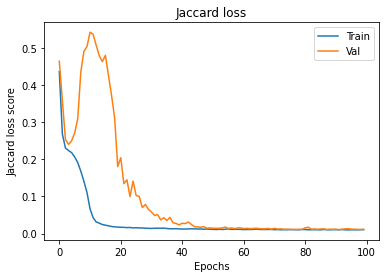

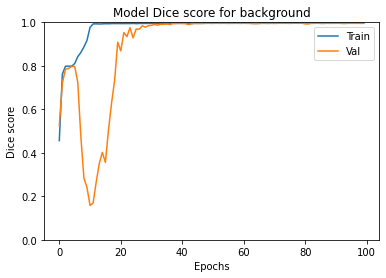

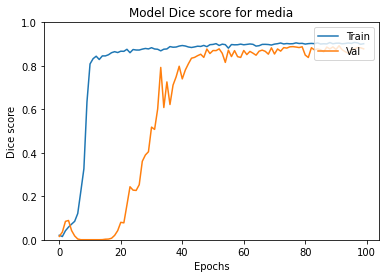

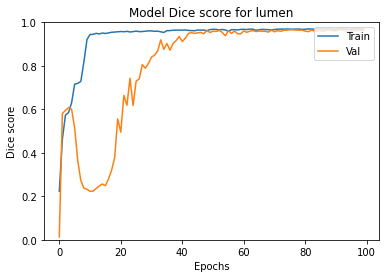

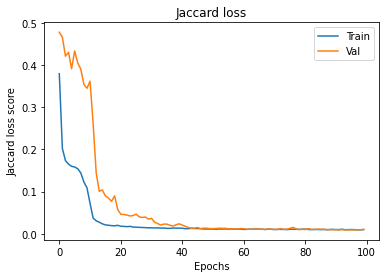

...

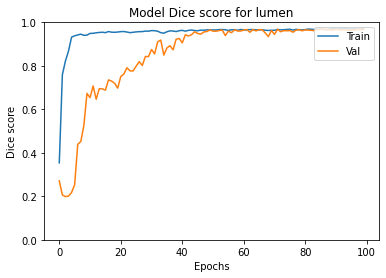

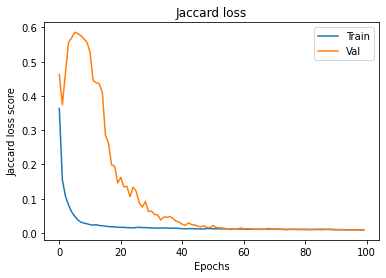

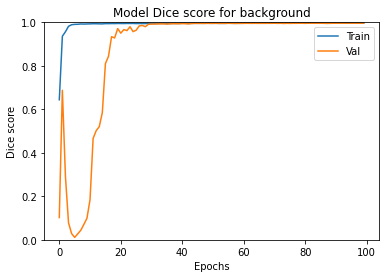

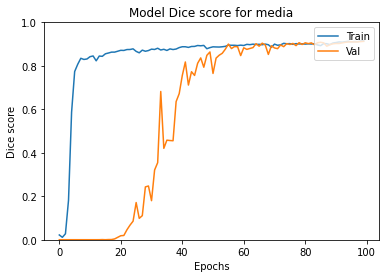

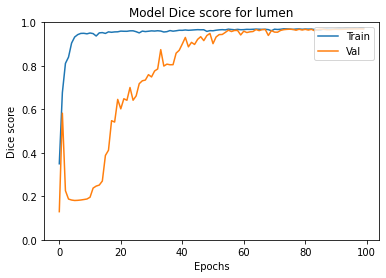

In [22]:
from tensorflow.keras import backend as K

# Prediction of all test images
def get_class_mask_from_prediction(prediction):
    return np.argmax(prediction, axis=-1)

data_by_fold = []

for j, (train_idx, val_idx) in foldsB:
    
    # Free up RAM in case the model definition cells were run multiple times
    K.clear_session()
    epochs = 100
    optimizer = keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
    
    print('\nFold ',j)
    X_train_cv = images[train_idx]
    y_train_cv = masks[train_idx]
    X_valid_cv = images[val_idx]
    y_valid_cv = masks[val_idx]
    
    name_weights = f"modelD_fold{j}"
    callbacks = get_callbacks(name_weights=name_weights, patience_lr=15)
    train_generator, val_generator = get_image_generator(data_gen_args, images=X_train_cv, masks=y_train_cv)
    
    model = build_inception_resnetv2_unet(input_shape)
    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=metrics,
    )
    
    history = model.fit(
        gen_dtype(train_generator),
        validation_data=(X_valid_cv, y_valid_cv),
        shuffle=True,
        steps_per_epoch=len(X_train_cv)/batch_size,
        epochs=epochs,
        callbacks=callbacks,
        verbose=0
    )
    
    f1 = plt.figure(4*j+1)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Jaccard loss')
    plt.xlabel('Epochs')
    plt.ylabel('Jaccard loss score')
    plt.legend(['Train', 'Val'], loc='upper right')
    f1.show()

    f2 = plt.figure(4*j+2)
    plt.plot(history.history['dice_background'])
    plt.plot(history.history['val_dice_background'])
    plt.title('Model Dice score for background')
    plt.xlabel('Epochs')
    plt.ylabel('Dice score')
    plt.ylim([0, 1])
    plt.legend(['Train', 'Val'], loc='upper right')
    f2.show()

    f3 = plt.figure(4*j+3)
    plt.plot(history.history['dice_media'])
    plt.plot(history.history['val_dice_media'])
    plt.title('Model Dice score for media')
    plt.xlabel('Epochs')
    plt.ylabel('Dice score')
    plt.ylim([0, 1])
    plt.legend(['Train', 'Val'], loc='upper right')
    f3.show()

    f4 = plt.figure(4*j+4)
    plt.plot(history.history['dice_lumen'])
    plt.plot(history.history['val_dice_lumen'])
    plt.title('Model Dice score for lumen')
    plt.xlabel('Epochs')
    plt.ylabel('Dice score')
    plt.ylim([0, 1])
    plt.legend(['Train', 'Val'], loc='upper right')
    f4.show()
    
    score = model.evaluate(images_test, masks_test, verbose=1)
    
    masks_test_from_pred = get_class_mask_from_prediction(masks_test)
    prediction_masks_test = np.array([get_class_mask_from_prediction(mask) for mask in model.predict(images_test)])
    
    df = custom_classification_report(masks_test_from_pred, prediction_masks_test)
    
    display(df)
    
    data_by_fold.append(df)

In [23]:
import math
data = data_by_fold[0].copy(deep=True)
for cls in ['background', 'media', 'lumen']:
    for metric in ['precision', 'recall', 'f1-score', 'accuracy', 'specificity', 'jaccard_score']:
        l = [fold[cls][metric] for fold in data_by_fold]
        data[cls][metric] = f"{np.mean(l)}({np.std(l)})"
    
    hausdorff_list = []
    for fold in data_by_fold:
        if math.inf not in list(fold[cls]['hausdorff_dist']):
            hausdorff_list += list(fold[cls]['hausdorff_dist'])
    
    data[cls]['hausdorff_dist'] = f"{np.mean(hausdorff_list)}({np.std(hausdorff_list)})"
    
display(data)
data.to_csv(os.path.join(os.getcwd(), "output", f"v{version}", "metrics-modelD.csv"))

,background,media,lumen
precision,0.9836180448633547(0.0014968030644986192),0.7931619521034426(0.02551824318732374),0.9302147453022613(0.01619454592117623)
recall,0.9921163206391995(0.000925652057874363),0.7193475421731997(0.029007612765259965),0.913030567186263(0.021138985807912666)
f1-score,0.98784756508322(0.00048177299609967436),0.7535361125126696(0.009188850846283228),0.9211742491019752(0.004249499810592459)
support,30795773,2353746,2903473
specificity,0.8951301582821571(0.00973881106719016),0.9867434324626544(0.0025122506404440894),0.9938112962763311(0.001658222275259843)
accuracy,0.9789123360926071(0.0008558101338497497),0.9692619294897801(0.0010991254644810025),0.9871757014026166(0.0005558988631705289)
jaccard_score,0.9759873950245492(0.0009407730029945611),0.6046265560556179(0.011868404539884685),0.853896227904967(0.007292682552943084)
hausdorff_dist,10.660601502381613(7.097714207937794),12.958543468732381(8.907068253381965),9.72964700031672(10.289293079279728)


In [22]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

def get_mask_from_prediction(prediction):
    return np.rint(prediction)

def print_predictions(image, ground_truth, prediction, save_filename=None):
    image = np.copy(image)
    ground_truth = np.copy(ground_truth)
    prediction = np.copy(prediction)
    plt.figure(figsize=(20,20))
    plt.subplot(1, 5, 1)
    plt.title("Original image")
    plt.axis('off')
    plt.imshow(image)
    
    plt.subplot(1, 5, 2)
    plt.title("Ground Truth")
    plt.axis('off')
    plt.imshow(ground_truth)
    
    plt.subplot(1, 5, 3)
    plt.title("Prediction")
    plt.axis('off')
    plt.imshow(prediction) 
    
    if save_filename:
        plt.savefig(os.path.join(os.getcwd(), "output", "v1", "masks_prediction", save_filename))

    handles = [
        mpatches.Patch(color='red', label='Ground Truth & Not Predicted'),
        mpatches.Patch(color='xkcd:green', label='Not Ground Truth & Predicted'),
        mpatches.Patch(color='blue', label='Ground Truth & Predicted')
    ]
    
    media_image = np.zeros(image.shape)
    media_image[:, :, 0][(ground_truth[:, :, 1]==1) & (prediction[:, :, 1]==0)] = 1
    media_image[:, :, 1][(ground_truth[:, :, 1]==0) & (prediction[:, :, 1]==1)] = 1
    media_image[:, :, 2][(ground_truth[:, :, 1]==1) & (prediction[:, :, 1]==1)] = 1
    plt.subplot(1, 5, 4)
    plt.title("Media prediction")
    plt.axis('off')
    plt.legend(handles=handles)
    plt.imshow(media_image)
    
    lumen_image = np.zeros(image.shape)
    lumen_image[:, :, 0][(ground_truth[:, :, 2]==1) & (prediction[:, :, 2]==0)] = 1
    lumen_image[:, :, 1][(ground_truth[:, :, 2]==0) & (prediction[:, :, 2]==1)] = 1
    lumen_image[:, :, 2][(ground_truth[:, :, 2]==1) & (prediction[:, :, 2]==1)] = 1
    plt.subplot(1, 5, 5)
    plt.title("Lumen prediction")
    plt.axis('off')
    plt.legend(handles=handles)
    plt.imshow(lumen_image)
    
    if save_filename:
        plt.savefig(os.path.join(os.getcwd(), "output", "v2", "predictionsD", save_filename))

2022-01-20 16:10:10.320979: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-01-20 16:10:10.340643: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 2299965000 Hz
2022-01-20 16:10:12.311586: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2022-01-20 16:10:12.594000: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8202
2022-01-20 16:10:12.820009: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-01-20 16:10:12.820034: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2022-01-20 16:10:12.820372: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-01-20 16:10:12.820425: W tensorflow/stream_executor/gpu/redzone_allocator.cc:31

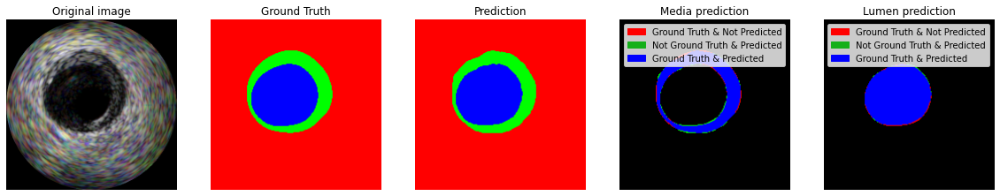

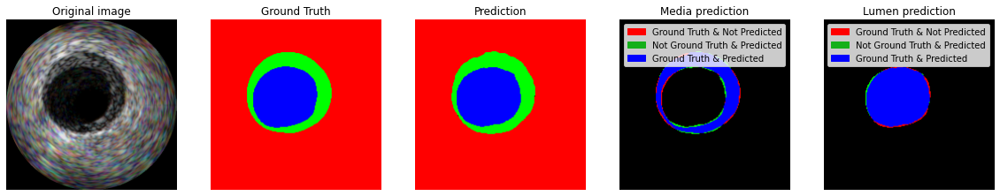

In [23]:
# Show some predictions from the training dataset
tf.keras.backend.clear_session()

best_model = build_inception_resnetv2_unet(input_shape)

best_model.load_weights("modelD_fold4")

best_model.compile(
    optimizer=optimizer,
    loss=loss,
    metrics=metrics,
)

samples = 2


random_num = random.randint(0, len(images)-samples)

test_images = images[random_num:random_num+samples]
test_masks = masks[random_num:random_num+samples]
test_predictions = best_model.predict(test_images)

for i in range(samples):
    print_predictions(test_images[i], test_masks[i], get_mask_from_prediction(test_predictions[i]))

<Figure size 720x2880 with 0 Axes>

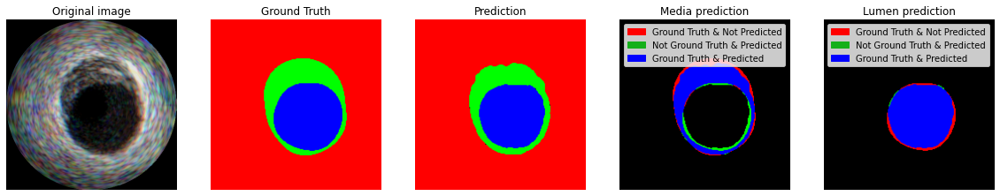

In [79]:
# Show some predictions from the test dataset
plt.figure(figsize=(10,40))

def get_mask_from_prediction(prediction):
    return np.rint(prediction)
tf.keras.backend.clear_session()

best_model = build_inception_resnetv2_unet(input_shape)

best_model.load_weights("modelD_fold4")

best_model.compile(
    optimizer=optimizer,
    loss=loss,
    metrics=metrics,
)

num = 252

test_images = images_test[num:num+1]
test_masks = masks_test[num:num+1]
test_predictions = best_model.predict(test_images)

print_predictions(
    test_images[0],
    test_masks[0],
    get_mask_from_prediction(test_predictions[0])
)

## Let's test our model

In [23]:
score = best_model.evaluate(images_test, masks_test, verbose=1)
print("Test loss:", score[0])
print("Test metric:", score[1])

31/31 [==============================] - 22s 504ms/step - loss: 0.0232 - dice_background: 0.9876 - dice_media: 0.7426 - dice_lumen: 0.9102
Test loss: 0.023196326568722725
Test metric: 0.9875957369804382


/tmp/ipykernel_28487/2018226691.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


<Figure size 720x2880 with 0 Axes>

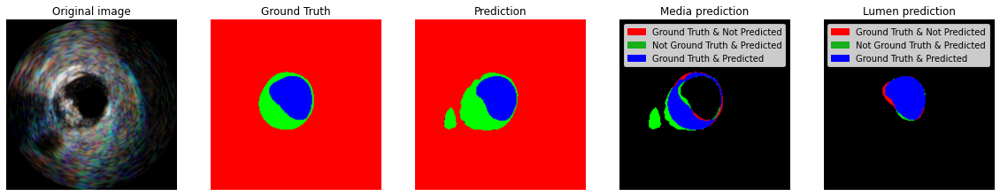

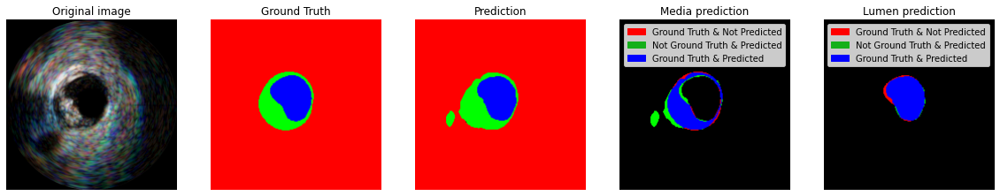

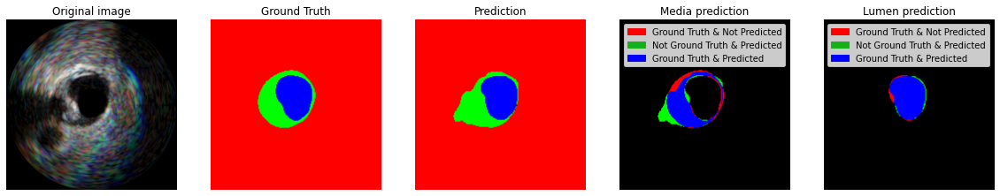

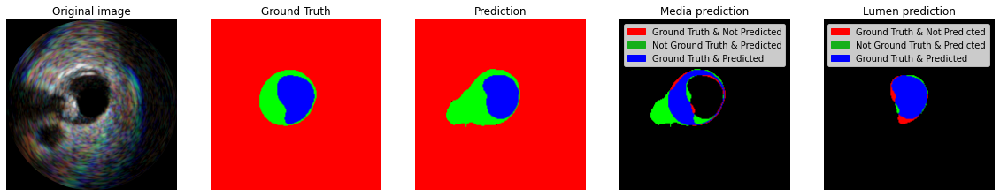

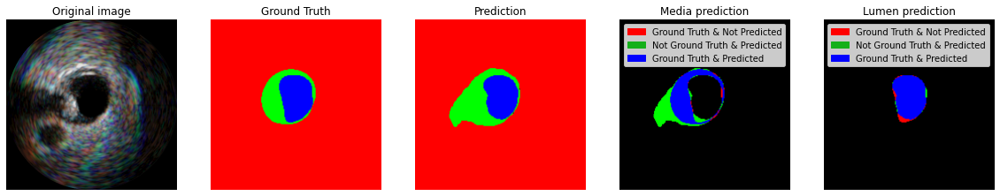

...

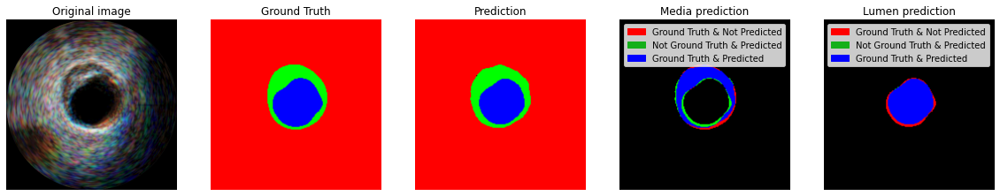

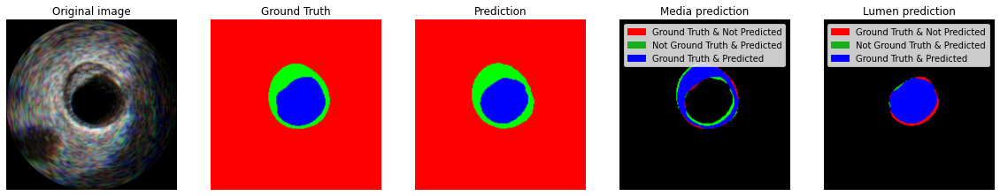

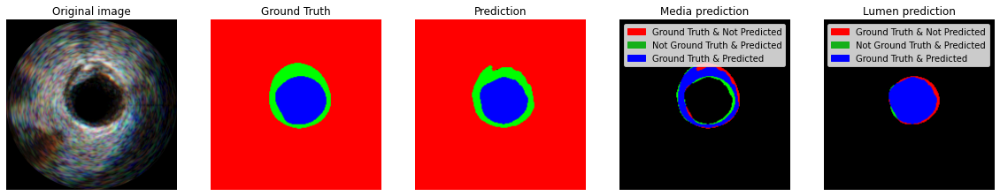

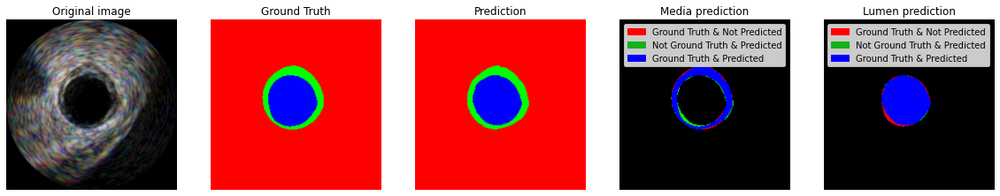

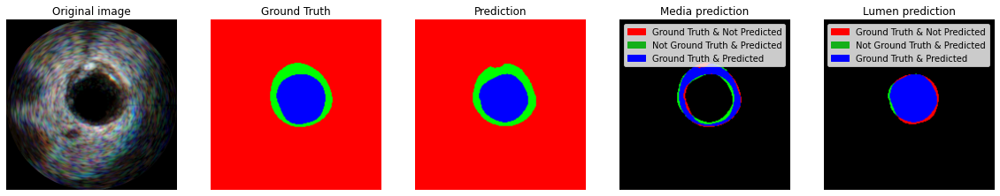

In [24]:
# Show some predictions from the test dataset
plt.figure(figsize=(10,40))

def get_mask_from_prediction(prediction):
    return np.rint(prediction)

samples = 20

test_images = images_test[:samples]
test_masks = masks_test[:samples]
test_predictions = best_model.predict(test_images)

for i in range(samples):
    save_filename=f"frame_03_00{10+i:02}_003.png"
    print_predictions(
        test_images[i],
        test_masks[i],
        get_mask_from_prediction(test_predictions[i]),
        save_filename=save_filename
    )

## Now let's plot some measures of our results
First, we will plot the confusion matrix to see which classes are overpredicted and which ones are underpredicted. We expect that the model overpredicts the background.

In [23]:
# Prediction of all test images
def get_class_mask_from_prediction(prediction):
    return np.argmax(prediction, axis=-1)
    
masks_test = get_class_mask_from_prediction(masks_test)
prediction_masks_test = np.array([get_class_mask_from_prediction(mask) for mask in best_model.predict(images_test)])

2022-01-17 18:39:38.998547: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 432635904 exceeds 10% of free system memory.
2022-01-17 18:39:42.612921: W tensorflow/core/common_runtime/bfc_allocator.cc:271] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.18GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2022-01-17 18:39:57.380324: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 432635904 exceeds 10% of free system memory.


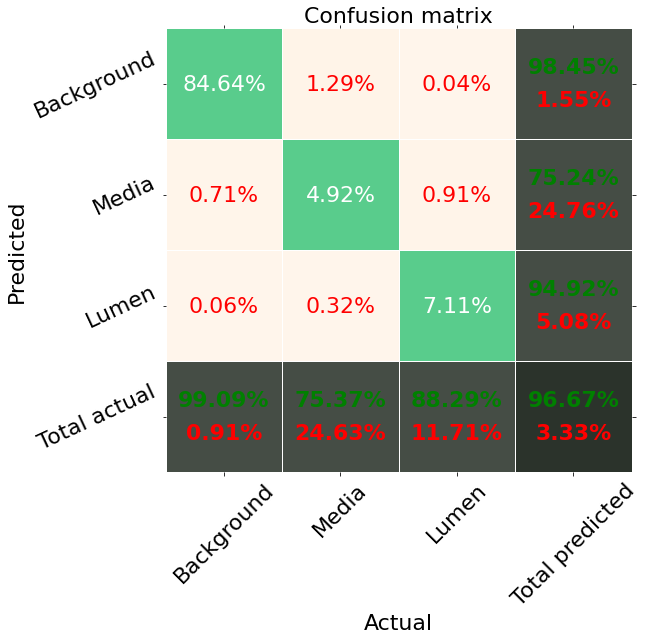

In [24]:
from Challenge_measures.confusion_matrix_pretty_print import pp_matrix_from_data
pp_matrix_from_data(
    masks_test.flatten(),
    prediction_masks_test.flatten(),
    columns=['Background', 'Media', 'Lumen'],
    fz=22
)